# ControlNet Based Pipeline

In [1]:
import os
import urllib.request
from io import BytesIO
import requests
import json

import torch

from PIL import Image
import numpy as np
import cv2
import matplotlib.pyplot as plt
import scipy
import h5py

from diffusers import (ControlNetModel, DiffusionPipeline,
                       StableDiffusionControlNetPipeline,
                       UniPCMultistepScheduler)

import open3d as o3d

import matplotlib.image as mpimg
import re
from csv import writer

from transformers import MaskFormerImageProcessor, MaskFormerForInstanceSegmentation
#from transformers import AutoImageProcessor, UperNetForSemanticSegmentation

from models_3d import *
from utils.preprocessing import *
from models.model_data import *
from models import controlnet_model_wrapper


WARNING[XFORMERS]: xFormers can't load C++/CUDA extensions. xFormers was built for:
    PyTorch 1.13.1+cu117 with CUDA 1107 (you have 1.12.1+cpu)
    Python  3.8.10 (you have 3.8.16)
  Please reinstall xformers (see https://github.com/facebookresearch/xformers#installing-xformers)
  Memory-efficient attention, SwiGLU, sparse and more won't be available.
  Set XFORMERS_MORE_DETAILS=1 for more details


In [2]:
torch.cuda.empty_cache()
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

In [3]:
CONDITION_TYPE = "seg"
CONTROLNET_MODEL_IDS = {
    'canny': 'lllyasviel/sd-controlnet-canny',
    'hough': 'lllyasviel/sd-controlnet-mlsd',
    'hed': 'lllyasviel/sd-controlnet-hed',
    'scribble': 'lllyasviel/sd-controlnet-scribble',
    'pose': 'lllyasviel/sd-controlnet-openpose',
    'seg': 'lllyasviel/sd-controlnet-seg',
    'depth': 'lllyasviel/sd-controlnet-depth',
    'normal': 'lllyasviel/sd-controlnet-normal',
}

## Data Utils

In [4]:
def prepare_nyu_data(rgb_img=None, condition_img=None):
    
    img_ = None
    if rgb_img is not None:
        # reshape
        img_ = np.empty([rgb_img.shape[2], rgb_img.shape[1], 3])
        img_[:,:,0] = rgb_img[0,:,:].T
        img_[:,:,1] = rgb_img[1,:,:].T
        img_[:,:,2] = rgb_img[2,:,:].T
        img_ = img_.astype(np.uint8)
        img_ = img_[10:-9,10:-9]
    
    condition_np = None
    if condition_img is not None:
        condition_np = np.asarray(condition_img.T, dtype=np.float32, order="C" )
        condition_np = condition_np.astype(np.float32)
        condition_np = condition_np[10:-9,10:-9]
        
    # removing edge artifacts
    return img_, condition_np

In [5]:
def align_midas(midas_pred, ground_truth):
    ground_truth_invert = 1 / (ground_truth + 10e-6) # invert absolute depth with meters
    x = midas_pred.copy().flatten()  # Midas Depth
    y = ground_truth_invert.copy().flatten()  # Realsense invert Depth
    A = np.vstack([x, np.ones(len(x))]).T
    s, t = np.linalg.lstsq(A, y, rcond=None)[0]
    midas_aligned_invert = midas_pred * s + t
    midas_aligned = 1 /  (midas_aligned_invert + 10e-6)

    return midas_aligned

In [6]:
# for nicer looking plot titles 
def break_up_string(text, line_limit = 50):

    char_count = 0
    new_text = ""
    for word in text.split():
        if not new_text:
            new_text = word
            char_count = len(word)
        elif len(word) + char_count < line_limit:
            new_text = " ".join([new_text,word])
            char_count += len(word)
        else:
            new_text = "\n".join([new_text,word])
            char_count = len(word)
    return new_text
        
        

## Loading ControlNet

In [7]:
CONTROLNET_MODEL_ID = CONTROLNET_MODEL_IDS[CONDITION_TYPE]

#'runwayml/stable-diffusion-v1-5'

BASE_MODEL_ID = "runwayml/stable-diffusion-v1-5"

torch.cuda.empty_cache()
controlnet = ControlNetModel.from_pretrained(CONTROLNET_MODEL_ID,
                                                     torch_dtype=torch.float32)
coltrolnet_pipe = StableDiffusionControlNetPipeline.from_pretrained(
            BASE_MODEL_ID,
            safety_checker=None,
            controlnet=controlnet,
            torch_dtype=torch.float32)
coltrolnet_pipe.scheduler = UniPCMultistepScheduler.from_config(
            coltrolnet_pipe.scheduler.config)
#coltrolnet_pipe.enable_xformers_memory_efficient_attention()
coltrolnet_pipe.to(device)
torch.cuda.empty_cache()

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

C:\Users\User\anaconda3\envs\stable_diff\lib\site-packages\transformers\models\clip\feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


## Inference on ControlNet

### Constants

In [8]:
# Defaults ------------
image_resolution = 512
depth_resolution = 512

additional_prompt = 'best quality, extremely detailed'
negative_prompt   = 'longbody, lowres, bad anatomy, bad hands, missing fingers, extra digit, fewer digits, cropped, worst quality, low quality'
num_steps         = 30
guidance_scale    = 9
seed              = 1825989188

### Prompt Ideas

In [9]:
interior_design_prompt_1 = "Intricate, Ornate, Embellished, Elaborate, Detailed, Decorative, Intricately-crafted, Luxurious, Ornamented, and Artistic cloak, open book, sparks, cozy library in background, furniture, fire place, food, wine, pet, chandelier, High Definition, Night time, Photorealism, realistic"
interior_design_prompt_2 = "Residential home high end futuristic interior, olson kundig, Interior Design by Dorothy Draper, maison de verre, axel vervoordt, award winning photography of an indoor-outdoor living library space, minimalist modern designs, high end indoor/outdoor residential living space, rendered in vray, rendered in octane, rendered in unreal engine, architectural photography, photorealism, featured in dezeen, cristobal palma. 5 chaparral landscape outside, black surfaces/textures for furnishings in outdoor space"
#interior_design_prompt_3 = 

### Inference functions

In [10]:
def HWC3(x):
    #assert x.dtype == np.uint8
    if x.ndim == 2:
        x = x[:, :, None]
    assert x.ndim == 3
    H, W, C = x.shape
    assert C == 1 or C == 3 or C == 4
    if C == 3:
        return x
    if C == 1:
        return np.concatenate([x, x, x], axis=2)
    if C == 4:
        color = x[:, :, 0:3].astype(np.float32)
        alpha = x[:, :, 3:4].astype(np.float32) / 255.0
        y = color * alpha + 255.0 * (1.0 - alpha)
        y = y.clip(0, 255).astype(np.uint8)
        return y
    

def resize_image(input_image, resolution):
    
    if len(input_image.shape) == 3:
        H, W, C = input_image.shape
    else:
         H, W = input_image.shape
    H = float(H)
    W = float(W)
    k = float(resolution) / min(H, W)
    H *= k
    W *= k
    H = int(np.round(H / 64.0)) * 64
    W = int(np.round(W / 64.0)) * 64
    img = cv2.resize(input_image, (W, H), interpolation=cv2.INTER_LANCZOS4 if k > 1 else cv2.INTER_AREA)
    return img

def preprocess_for_controlnet(ground_depth_map):
    input_image = HWC3(src_img_np)
    input_depth = HWC3(ground_depth)
    
    input_image = resize_image(input_image, image_resolution)
    input_depth = resize_image(input_depth, image_resolution)
    return PIL.Image.fromarray(control_image), PIL.Image.fromarray(input_depth)
   
#src_img_np, ground_depth_map 
#plt.imshow(ground_depth_map, cmap='RdBu')
#plt.colorbar()

In [17]:
# NYUv2 Palette 

names = ["unlabeled", "wall", "floor", "cabinet", "bed", "chair", "sofa", "table", "door", 
             "window", "bookshelf", "picture", "counter", "blinds", "desk", "shelves", "curtain", 
             "dresser", "pillow", "mirror", "floor mat", "clothes", "ceiling", "books", "refridgerator", 
             "television", "paper", "towel", "shower curtain", "box", "whiteboard", "person", "night stand",
             "toilet", "sink", "lamp", "bathtub", "bag", "otherstructure", "otherfurniture", "otherprop"]
    
colors = np.array([
		[0, 0, 0],
		[165,66,104],
		[83,194,76],
		[172,80,199],
		[142,188,58],
		[120,101,223],
		[65,146,51],
		[207,67,168],
		[88,197,124],
		[219,62,131],
		[88,200,169],
		[208,63,54],
		[59,188,195],
		[222,112,55],
		[91,123,222],
		[188,176,57],
		[121,84,172],
		[110,141,48],
		[218,127,219],
		[53,124,65],
		[157,79,149],
		[219,151,53],
		[85,99,164],
		[106,111,27],
		[179,146,214],
		[107,146,81],
		[206,70,94],
		[94,169,121],
		[221,131,174],
		[35,100,63],
		[222,127,120],
		[89,191,236],
		[162,84,46],
		[112,151,218],
		[142,111,44],
		[59,144,191],
		[213,161,107],
		[46,138,112],
		[139,74,95],
		[163,181,109],
		[98,106,50],
	], dtype=np.uint8)

	name2id = { name: idx for idx, name in enumerate(names) }


IndentationError: unexpected indent (2135574249.py, line 53)

In [11]:
"""ADE20K palette that maps each class to RGB values."""
ade_palette = np.array([[120, 120, 120], [180, 120, 120], [6, 230, 230], [80, 50, 50],
            [4, 200, 3], [120, 120, 80], [140, 140, 140], [204, 5, 255],
            [230, 230, 230], [4, 250, 7], [224, 5, 255], [235, 255, 7],
            [150, 5, 61], [120, 120, 70], [8, 255, 51], [255, 6, 82],
            [143, 255, 140], [204, 255, 4], [255, 51, 7], [204, 70, 3],
            [0, 102, 200], [61, 230, 250], [255, 6, 51], [11, 102, 255],
            [255, 7, 71], [255, 9, 224], [9, 7, 230], [220, 220, 220],
            [255, 9, 92], [112, 9, 255], [8, 255, 214], [7, 255, 224],
            [255, 184, 6], [10, 255, 71], [255, 41, 10], [7, 255, 255],
            [224, 255, 8], [102, 8, 255], [255, 61, 6], [255, 194, 7],
            [255, 122, 8], [0, 255, 20], [255, 8, 41], [255, 5, 153],
            [6, 51, 255], [235, 12, 255], [160, 150, 20], [0, 163, 255],
            [140, 140, 140], [250, 10, 15], [20, 255, 0], [31, 255, 0],
            [255, 31, 0], [255, 224, 0], [153, 255, 0], [0, 0, 255],
            [255, 71, 0], [0, 235, 255], [0, 173, 255], [31, 0, 255],
            [11, 200, 200], [255, 82, 0], [0, 255, 245], [0, 61, 255],
            [0, 255, 112], [0, 255, 133], [255, 0, 0], [255, 163, 0],
            [255, 102, 0], [194, 255, 0], [0, 143, 255], [51, 255, 0],
            [0, 82, 255], [0, 255, 41], [0, 255, 173], [10, 0, 255],
            [173, 255, 0], [0, 255, 153], [255, 92, 0], [255, 0, 255],
            [255, 0, 245], [255, 0, 102], [255, 173, 0], [255, 0, 20],
            [255, 184, 184], [0, 31, 255], [0, 255, 61], [0, 71, 255],
            [255, 0, 204], [0, 255, 194], [0, 255, 82], [0, 10, 255],
            [0, 112, 255], [51, 0, 255], [0, 194, 255], [0, 122, 255],
            [0, 255, 163], [255, 153, 0], [0, 255, 10], [255, 112, 0],
            [143, 255, 0], [82, 0, 255], [163, 255, 0], [255, 235, 0],
            [8, 184, 170], [133, 0, 255], [0, 255, 92], [184, 0, 255],
            [255, 0, 31], [0, 184, 255], [0, 214, 255], [255, 0, 112],
            [92, 255, 0], [0, 224, 255], [112, 224, 255], [70, 184, 160],
            [163, 0, 255], [153, 0, 255], [71, 255, 0], [255, 0, 163],
            [255, 204, 0], [255, 0, 143], [0, 255, 235], [133, 255, 0],
            [255, 0, 235], [245, 0, 255], [255, 0, 122], [255, 245, 0],
            [10, 190, 212], [214, 255, 0], [0, 204, 255], [20, 0, 255],
            [255, 255, 0], [0, 153, 255], [0, 41, 255], [0, 255, 204],
            [41, 0, 255], [41, 255, 0], [173, 0, 255], [0, 245, 255],
            [71, 0, 255], [122, 0, 255], [0, 255, 184], [0, 92, 255],
            [184, 255, 0], [0, 133, 255], [255, 214, 0], [25, 194, 194],
            [102, 255, 0], [92, 0, 255]])

In [12]:
def prepare_nyu_controlnet_seg_nyu40(x, is_nyu_ground=True, num_classes=50, num_samples=1):
    
    
    color_group = np.stack( [np.random.choice(range(256), size=3) for _ in range(num_classes)], axis=0 )
    
    rgb_color_image = np.zeros((x.shape[0], x.shape[1], 3), dtype=np.float32)
    rgb_color_image = color_group[np.uint16(x)]
    rgb_color_image = rgb_color_image.clip(0, 255).astype(np.uint8)
    rgb_color_image = HWC3(rgb_color_image)

    temp_img = resize_image(rgb_color_image, image_resolution)
    H, W = temp_img.shape[:2]
    new_img = cv2.resize(rgb_color_image, (W, H), interpolation=cv2.INTER_NEAREST)        

    control_image = Image.fromarray(np.uint8(new_img))
    
    return control_image, H, W

In [13]:
def prepare_nyu_controlnet_depth(x, is_nyu_ground=True, num_samples=1):
    
    new_img = x

    if is_nyu_ground:
        new_img = new_img* 25.5
        new_img = 1 / (new_img + 10e-6)
        
    new_img -= np.min(new_img)
    new_img /= np.max(new_img)
    new_img = (new_img * 255.0).clip(0, 255).astype(np.uint8)
    new_img = HWC3(new_img)
    temp_img = resize_image(new_img, image_resolution)
    H, W = temp_img.shape[:2]
    new_img = cv2.resize(new_img, (W, H), interpolation=cv2.INTER_LINEAR)
    
    #detected_map = np.moveaxis(detected_map, -1, 0)

    ##control = torch.from_numpy(detected_map.copy()).float() / 255.0
    
    #result = Image.fromarray(detected_map)

    #result = torch.stack([control for _ in range(num_samples)], dim=0)
    control_image = Image.fromarray(np.uint8(new_img))
    
    return control_image, H, W

In [14]:
def infer_controlnet(source_image, prompt, H, W, guidance_scale = 7.5,  condition_image= None, 
                     num_inference_steps=50, save_name= '', comparison_save_name= '', ): 
    
    generator = torch.Generator().manual_seed(seed)
    
    prompt = f'{prompt}, {additional_prompt}'
    
    #source_image = Image.fromarray(source_image)
    #depth_tensor = torch.from_numpy(np.expand_dims(depth_image,axis=0))
    
    #depth_image = Image.fromarray(depth_image)
    
    
    results = coltrolnet_pipe(prompt=prompt, negative_prompt=negative_prompt, 
                                  image=condition_image,
                                  #image=source_image, 
                                  height = H,
                                  width = W,
                                  guidance_scale=guidance_scale, 
                                  num_inference_steps=num_inference_steps,
                                  generator=generator)
    
    title = break_up_string(prompt)
    
    fontsize=12
    if len(title) / 50 > 3:
        fontsize=10

    fig,ax = plt.subplots(1,2)
    ax[0].imshow(source_image)
    ax[1].imshow(results.images[0])
    fig.suptitle(title, fontsize=fontsize,  y=0.9)
    for a in ax:
        a.set_xticks([])
        a.set_yticks([])
        
    fig.tight_layout()
        
    if save_name:       
        results.images[0].save(save_name)
    if comparison_save_name:
        fig.savefig(comparison_save_name)
        
    plt.show()
    
    return results.images[0]

## Loading Depth and Segmenation Models

In [15]:
#if CONDITION_TYPE == "depth":

model_type = "MiDaS"
midas = torch.hub.load("intel-isl/MiDaS", model_type)

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
midas.to(device)
midas.eval()

midas_transforms = torch.hub.load("intel-isl/MiDaS", "transforms")

if model_type == "DPT_Large" or model_type == "DPT_Hybrid":
    transform = midas_transforms.dpt_transform
elif model_type == "MiDaS":
    transform = midas_transforms.default_transform
else:
    transform = midas_transforms.small_transform
        
if CONDITION_TYPE == "seg":
    image_processor = MaskFormerImageProcessor.from_pretrained("facebook/maskformer-swin-large-ade")
    #image_processor = AutoImageProcessor.from_pretrained("openmmlab/upernet-convnext-small")
    image_segmentor = MaskFormerForInstanceSegmentation.from_pretrained("facebook/maskformer-swin-large-ade")
    #image_segmentor = UperNetForSemanticSegmentation.from_pretrained("openmmlab/upernet-convnext-small")

Using cache found in C:\Users\User/.cache\torch\hub\intel-isl_MiDaS_master
C:\Users\User\anaconda3\envs\stable_diff\lib\site-packages\torchvision\io\image.py:13: UserWarning: Failed to load image Python extension: Could not find module 'C:\Users\User\anaconda3\envs\stable_diff\Lib\site-packages\torchvision\image.pyd' (or one of its dependencies). Try using the full path with constructor syntax.
  warn(f"Failed to load image Python extension: {e}")


Loading weights:  None


Using cache found in C:\Users\User/.cache\torch\hub\facebookresearch_WSL-Images_main
Using cache found in C:\Users\User/.cache\torch\hub\intel-isl_MiDaS_master
C:\Users\User\anaconda3\envs\stable_diff\lib\site-packages\transformers\models\maskformer\image_processing_maskformer.py:401: FutureWarning: The `size_divisibility` argument is deprecated and will be removed in v4.27. Please use `size_divisor` instead.
  warnings.warn(
C:\Users\User\anaconda3\envs\stable_diff\lib\site-packages\transformers\models\maskformer\image_processing_maskformer.py:408: FutureWarning: The `max_size` argument is deprecated and will be removed in v4.27. Please use size['longest_edge'] instead.
  warnings.warn(


## Midas Inference

In [16]:
def infer_depth_map(image, save_name= '', display=True):
    
    input_batch = transform(image).to(device)

    with torch.no_grad():
        prediction = midas(input_batch)
        prediction = torch.nn.functional.interpolate(
            prediction.unsqueeze(1),
            size=image.shape[:2],
            mode="bicubic",
             align_corners=False,
        ).squeeze()

        output = prediction.cpu().numpy() 
        
        if save_name:
            with open(save_name+'.npy', 'wb') as f:
                np.save(f, output, allow_pickle=True, fix_imports=True)
        
        if display:
            plt.imshow(output)
            plt.show()
        
        #print("infer depth map done")
        
        return output

## Segmentation Inference

In [17]:
def infer_seg_ade20k(image, i, save_name= ''):
    
    #pixel_values = image_processor(image, return_tensors="pt").pixel_values
    inputs = image_processor(image, return_tensors="pt")
    
    with torch.no_grad():
        outputs = image_segmentor(**inputs)
        
    temp_img = resize_image(image, image_resolution)
    H, W = temp_img.shape[:2]
    
    seg = image_processor.post_process_semantic_segmentation(outputs, target_sizes=[(H, W)])[0]
    
    color_seg = np.zeros((seg.shape[0], seg.shape[1], 3), dtype=np.uint8) # height, width, 3
    
    for label, color in enumerate(ade_palette):
        color_seg[seg == label, :] = color
        
        
    #temp_img = resize_image(color_seg, image_resolution)
    #H, W = temp_img.shape[:2]
    #color_seg = cv2.resize(color_seg, (W, H), interpolation=cv2.INTER_NEAREST)      
 
    color_seg = color_seg.astype(np.uint8)
    control_image = Image.fromarray(color_seg)
    
    fontsize=12
    
    fig,ax = plt.subplots(1,2)
    ax[0].imshow(image)
    ax[1].imshow(control_image)
    fig.suptitle(f"Predicted ADE20k Segmentation for Image {i}", fontsize=fontsize,  y=0.8)
    for a in ax:
        a.set_xticks([])
        a.set_yticks([])
        
    fig.tight_layout()
        
    if save_name:       
        control_image.save(save_name+".png")
        
    plt.show()
    
    return control_image, H, W

## Depth Heatmap Visualisation

In [18]:
def get_depth_heat_map(ground_depth_map, predict_ground_depth_map, predict_depth_map, img_id=None, save_name=''):
    
    depth_diff = ground_depth_map - predict_depth_map
    
    _min, _max = np.amin(ground_depth_map), np.amax(ground_depth_map)
    
    fig,ax = plt.subplots(1,4, figsize=(24, 6), layout='constrained')
    ax[0].imshow(ground_depth_map, vmin = _min, vmax = _max)
    ax[1].imshow(predict_ground_depth_map, vmin = _min, vmax = _max)
    ax[2].imshow(predict_depth_map, vmin = _min, vmax = _max)
    
    heat_min = -4 
    heat_max = 4
    
    diff = ax[3].imshow(depth_diff, cmap='RdBu_r', vmin = heat_min, vmax = heat_max)

    cbar = fig.colorbar(diff, ax=ax[2], shrink=0.6)
    cbar.set_label('Ground truth - Predicted', rotation=90, labelpad=5)
    cbar.ax.set_yticklabels(["{:.2}".format(i) + " m" for i in cbar.get_ticks()]) # set ticks of your format
    
    ax[0].set_title('Ground Truth', fontsize=16)
    ax[1].set_title('Estimated Ground Truth', fontsize=16)
    ax[2].set_title('Generated', fontsize=16)
    ax[3].set_title('Difference Heat Map', fontsize=16)
    
    for a in ax:
        a.set_xticks([])
        a.set_yticks([])
    
    if img_id is not None:
        fig.suptitle(f"Depth Maps for Image - {img_id}", fontsize=18,  y=0.95)
    else:
        fig.suptitle(f"Depth Maps", fontsize=18,  y=0.95)
    

    if save_name:
        fig.savefig(save_name)
        
    plt.show()
        

## Point Cloud and Mesh

In [19]:
def get_point_cloud(rgb_image, depth_image, pcd_path, display=False):
    
    new_depth_image = o3d.geometry.Image(depth_image)

    rgbd_image = o3d.geometry.RGBDImage.create_from_color_and_depth(
        o3d.geometry.Image(rgb_image), o3d.geometry.Image(new_depth_image),
    depth_scale=10, convert_rgb_to_intensity=False) 
    
    pcd = o3d.geometry.PointCloud.create_from_rgbd_image(
        rgbd_image,
        o3d.camera.PinholeCameraIntrinsic(
            o3d.camera.PinholeCameraIntrinsicParameters.PrimeSenseDefault))
    pcd.estimate_normals(search_param=o3d.geometry.KDTreeSearchParamHybrid(radius=0.0104,max_nn=12))
    
    # Flip it, otherwise the pointcloud will be upside down
    pcd.transform([[1, 0, 0, 0], [0, -1, 0, 0], [0, 0, -1, 0], [0, 0, 0, 1]])
    
    #writing point cloud to file
    o3d.io.write_point_cloud(pcd_path, pcd, write_ascii=False, compressed=False, print_progress=False)
    
    if display:
        o3d.visualization.draw_geometries([pcd])
        
    return pcd 

def capture_pcd_with_view_params(pcd, pcd_path, view_setting_path):
    
    vis = o3d.visualization.Visualizer()
    
    vis.create_window(visible=False)
    vis.add_geometry(pcd)
    
    with open(view_setting_path, "r") as f: 
        js = json.load(f)
    
    vc=vis.get_view_control()
    vc.change_field_of_view(js['trajectory'][0]['field_of_view'])
    vc.set_front(js['trajectory'][0]['front'])
    vc.set_lookat(js['trajectory'][0]['lookat'])
    vc.set_up(js['trajectory'][0]['up'])
    vc.set_zoom(js['trajectory'][0]['zoom'])
    
    vis.poll_events()
    vis.update_renderer()
    vis.capture_screen_image(pcd_path)
    vis.destroy_window()

def get_mesh_from_pcd(pcd, method="ball_rolling"):

    with o3d.utility.VerbosityContextManager(o3d.utility.VerbosityLevel.Debug) as cm:
        
        if method == "poisson":    
            mesh, densities = o3d.geometry.TriangleMesh.create_from_point_cloud_poisson(pcd,
                depth=10, width=0, scale=1.1, linear_fit=True)
            print(mesh)
            o3d.visualization.draw_geometries([mesh])
            
            return mesh, densities
        
        if method == "ball_pivoting":
            radii = [0.005, 0.01, 0.02, 0.04]
            mesh = o3d.geometry.TriangleMesh.create_from_point_cloud_ball_pivoting(
                pcd, o3d.utility.DoubleVector(radii))
            o3d.visualization.draw_geometries([pcd, rec_mesh])
            
            return mesh
        
        if method == "alpha":
            tetra_mesh, pt_map = o3d.geometry.TetraMesh.create_from_point_cloud(pcd)
            
            for alpha in np.logspace(np.log10(0.5), np.log10(0.1), num=3):
                print(f"alpha={alpha:.3f}")
                mesh = o3d.geometry.TriangleMesh.create_from_point_cloud_alpha_shape(
                    pcd, alpha, tetra_mesh, pt_map)
                mesh.compute_vertex_normals()
                o3d.visualization.draw_geometries([mesh], mesh_show_back_face=True)
                
        if method == "ball_rolling":
            distances = pcd.compute_nearest_neighbor_distance()
            avg_dist = np.mean(distances)
            radius = 3 * avg_dist
            o3d.geometry.TriangleMesh.create_from_point_cloud_ball_pivoting(
                pcd, o3d.utility.DoubleVector([radius, radius * 2]))
            
            dec_mesh = mesh.simplify_quadric_decimation(100000)
            dec_mesh.remove_degenerate_triangles()
            dec_mesh.remove_duplicated_triangles()
            dec_mesh.remove_duplicated_vertices()
            dec_mesh.remove_non_manifold_edges()
            
            o3d.visualization.draw_geometries([mesh], mesh_show_back_face=True)

            
            
    

# Test Code

In [20]:
nyu_path = 'C:/Users/User/Documents/Data_Science/ar_stable_diffusion/data/nyu_depth_v2_labeled.mat'
nyu_result_root = './results/NYU/'
eval_results_path = nyu_result_root + "eval_logs.csv"

save_folder = nyu_result_root

guidance_scale = 7.5
strength=0.5
num_inference_steps=30

prompt= "baroque style palace room with ornate marble decorations and statues, landscape paintings on the walls, warm ambient lighting and painted ceiling"

prompt=interior_design_prompt_1

# read mat file
f = h5py.File(nyu_path)


C:\Users\User\AppData\Local\Temp\ipykernel_8552\4040629913.py:16: H5pyDeprecationWarning: The default file mode will change to 'r' (read-only) in h5py 3.0. To suppress this warning, pass the mode you need to h5py.File(), or set the global default h5.get_config().default_file_mode, or set the environment variable H5PY_DEFAULT_READONLY=1. Available modes are: 'r', 'r+', 'w', 'w-'/'x', 'a'. See the docs for details.
  f = h5py.File(nyu_path)


In [21]:
use_predicted_ground = False
CONDITION_TYPE = "seg"


rgb_images = f['images']
depth_maps = f['depths']
accel_data = f['accelData']
#seg_mask = f['labels']

# number of segmentation classes
num_classes = f['names'].shape[1]


if CONDITION_TYPE == "depth":
    condition_data = depth_maps
elif CONDITION_TYPE == "seg":
    condition_data = f['labels']
elif CONDITION_TYPE == "normal":
    condition_data = f['normals']

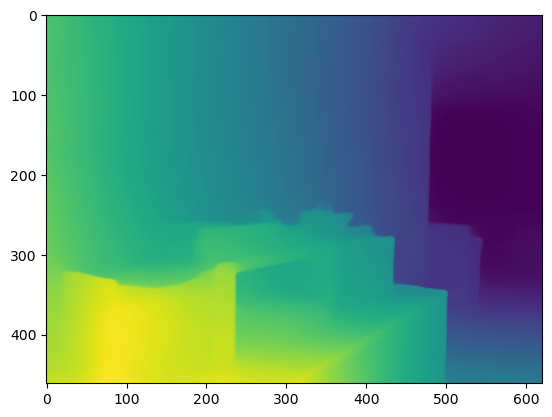

infer depth map done


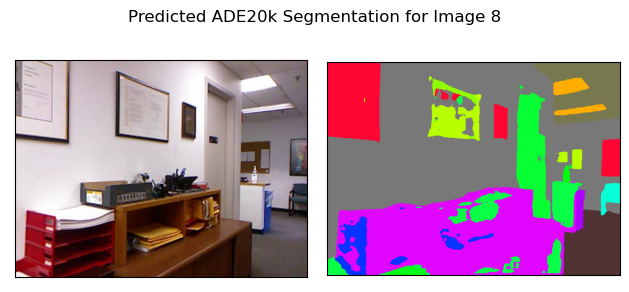

<class 'PIL.Image.Image'>
(704, 512)


  0%|          | 0/30 [00:00<?, ?it/s]

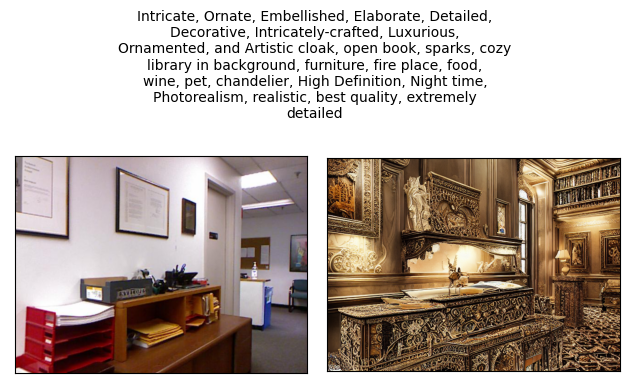

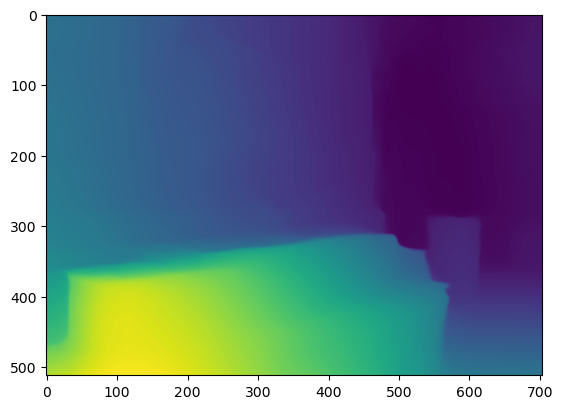

infer depth map done


C:\Users\User\AppData\Local\Temp\ipykernel_13336\788289030.py:19: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(["{:.2}".format(i) + " m" for i in cbar.get_ticks()]) # set ticks of your format


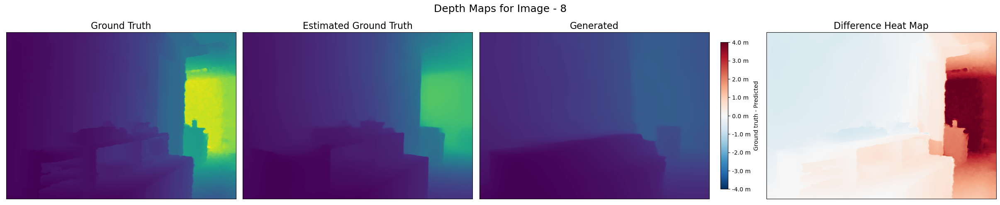

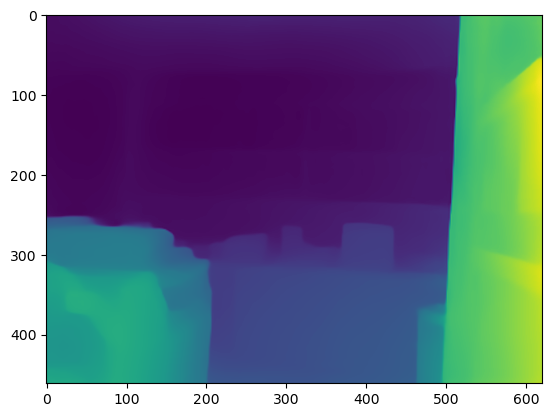

infer depth map done


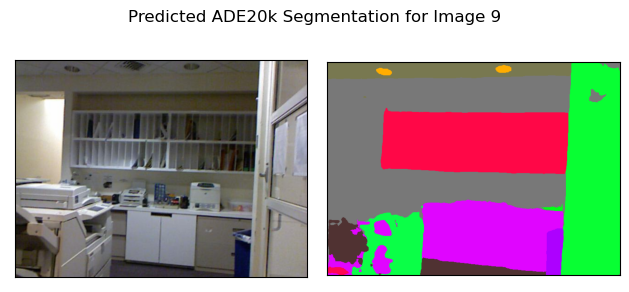

<class 'PIL.Image.Image'>
(704, 512)


  0%|          | 0/30 [00:00<?, ?it/s]

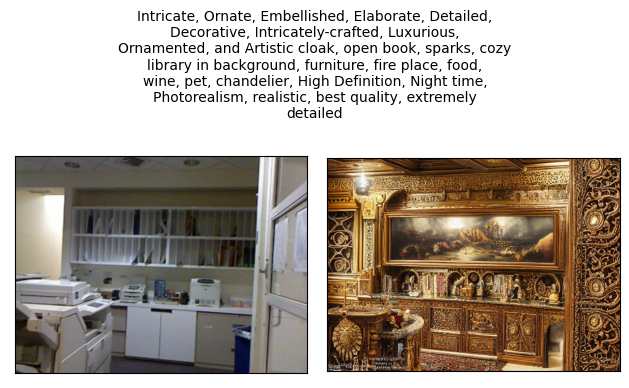

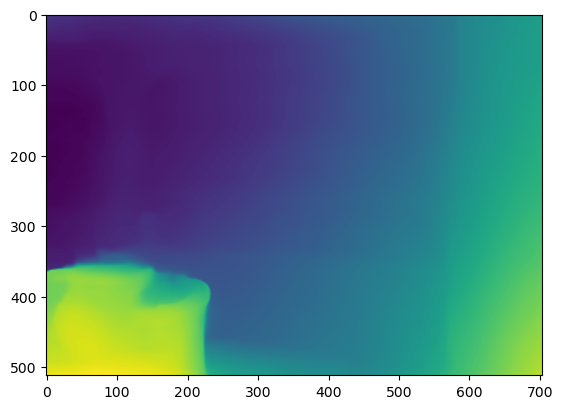

infer depth map done


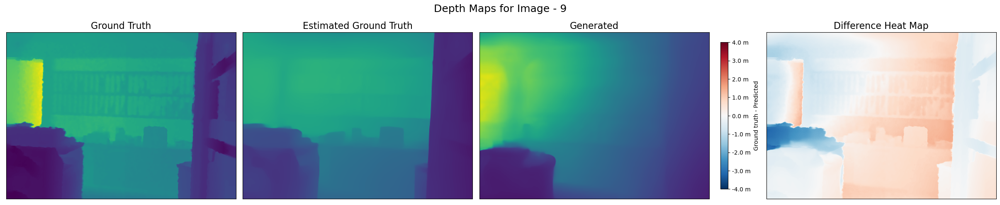

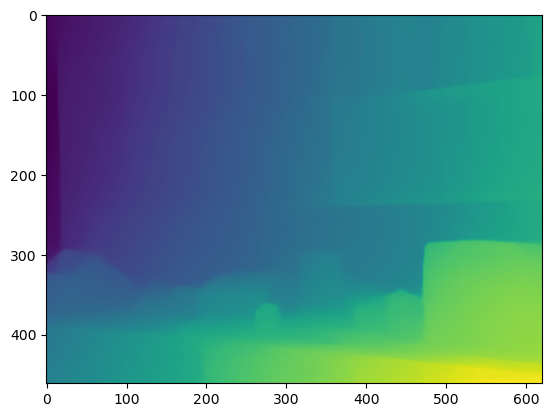

infer depth map done


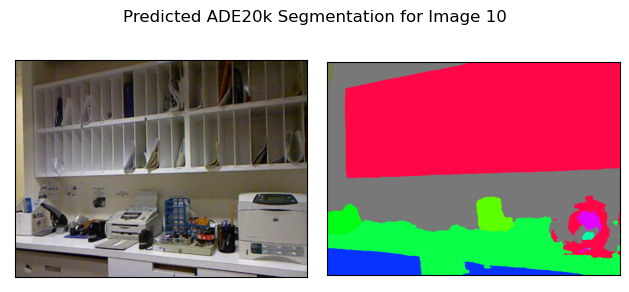

<class 'PIL.Image.Image'>
(704, 512)


  0%|          | 0/30 [00:00<?, ?it/s]

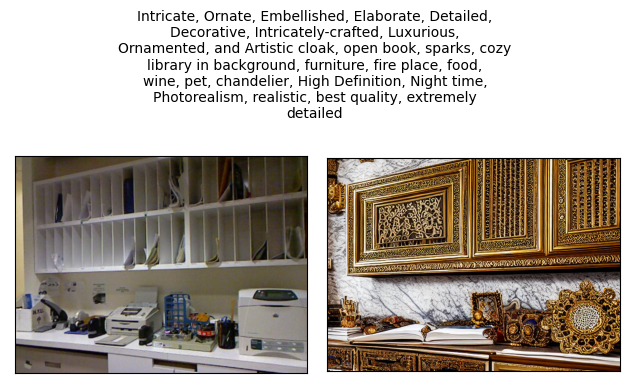

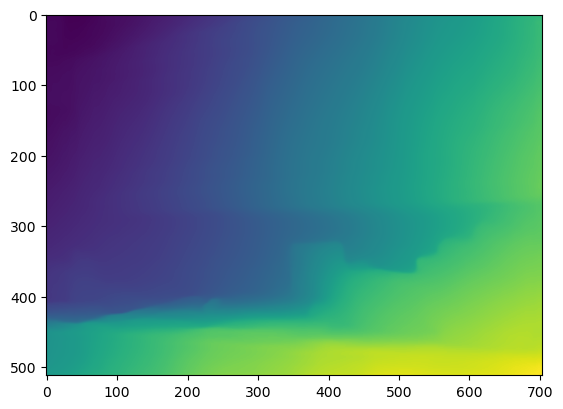

infer depth map done


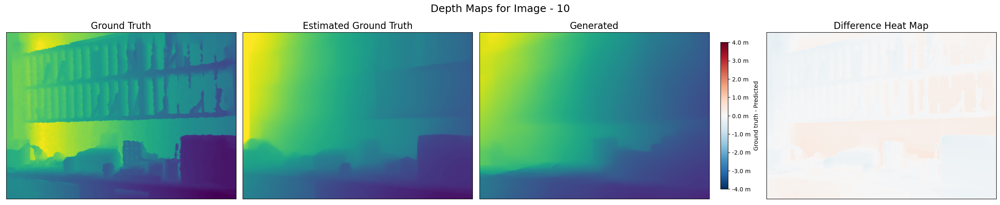

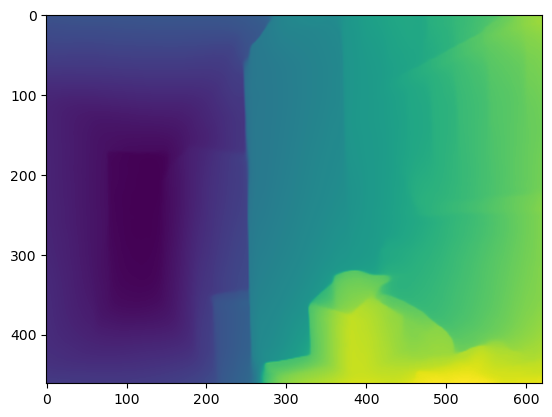

infer depth map done


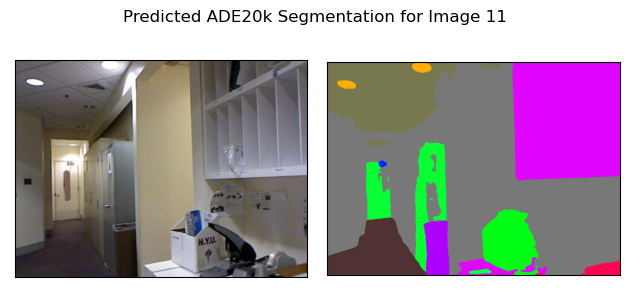

<class 'PIL.Image.Image'>
(704, 512)


  0%|          | 0/30 [00:00<?, ?it/s]

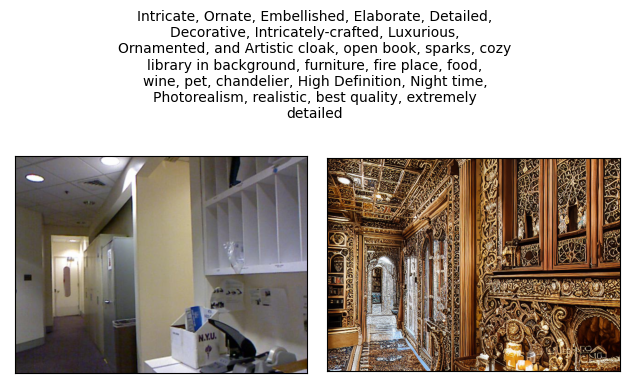

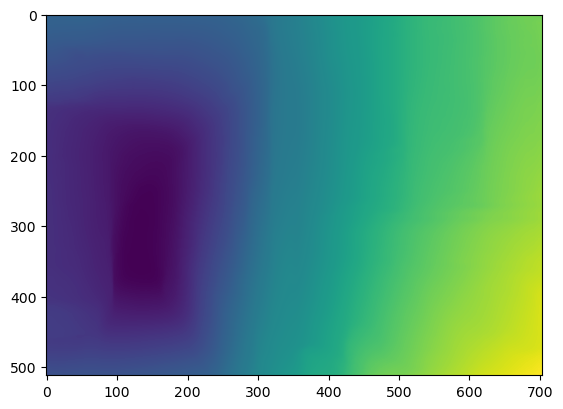

infer depth map done


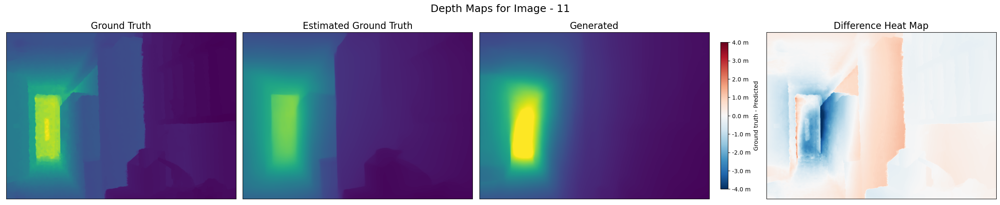

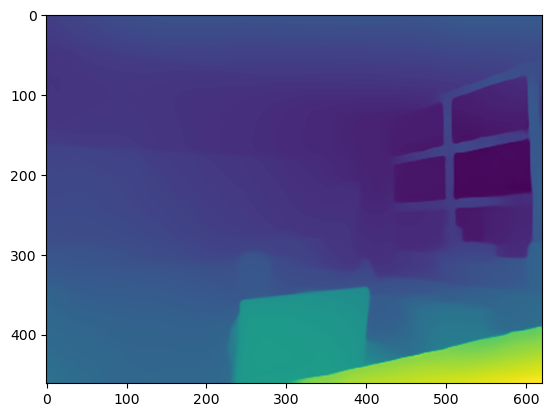

infer depth map done


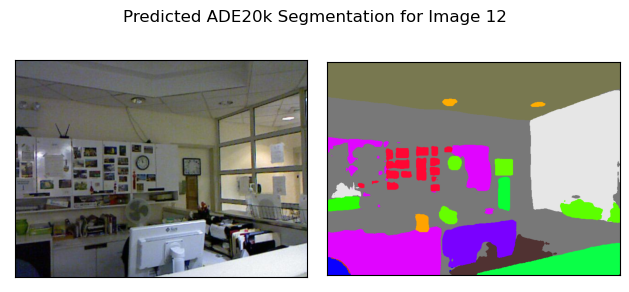

<class 'PIL.Image.Image'>
(704, 512)


  0%|          | 0/30 [00:00<?, ?it/s]

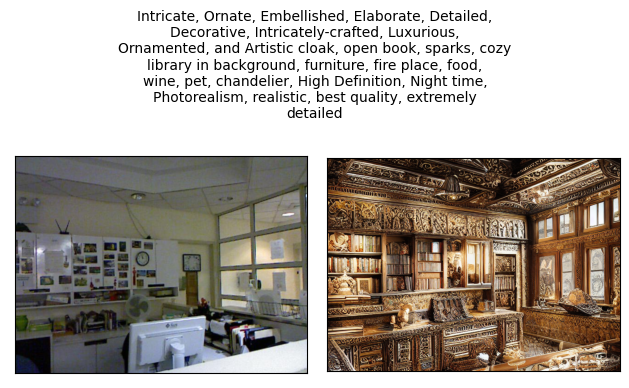

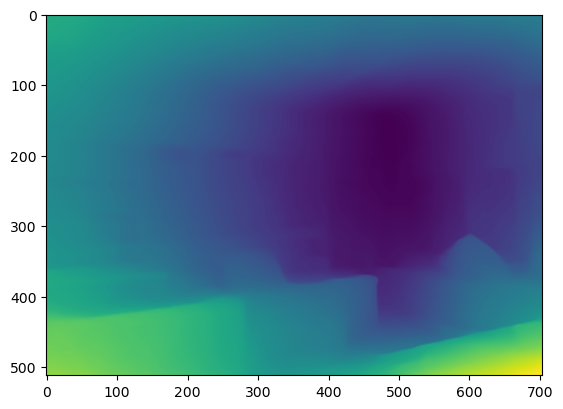

infer depth map done


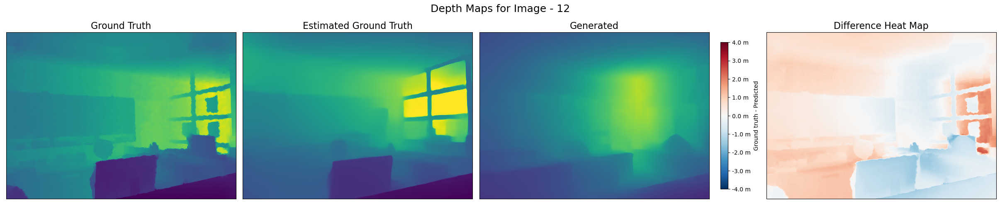

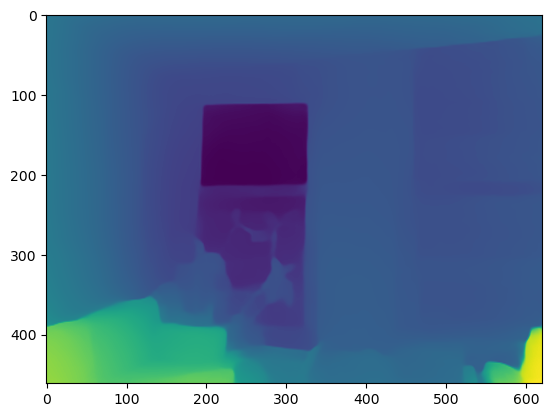

infer depth map done


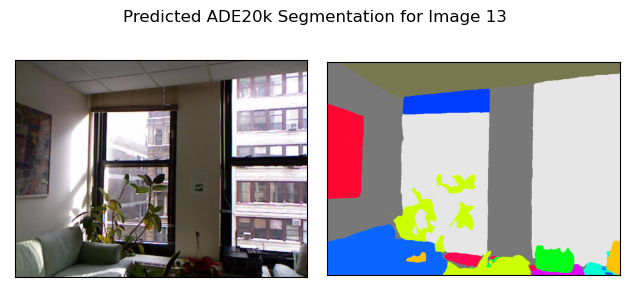

<class 'PIL.Image.Image'>
(704, 512)


  0%|          | 0/30 [00:00<?, ?it/s]

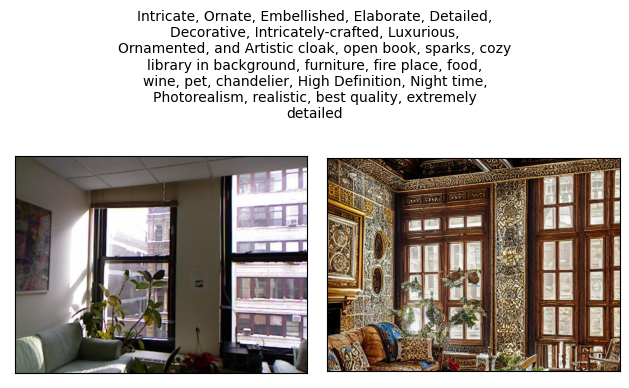

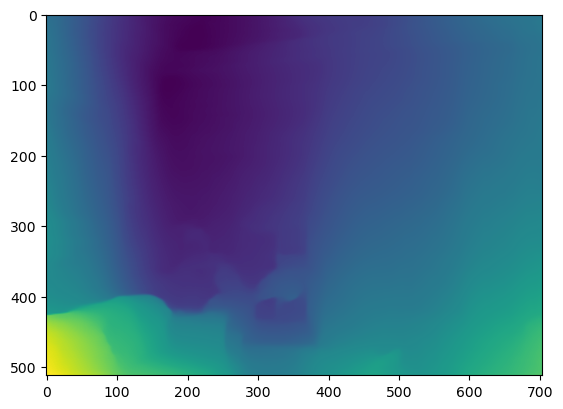

infer depth map done


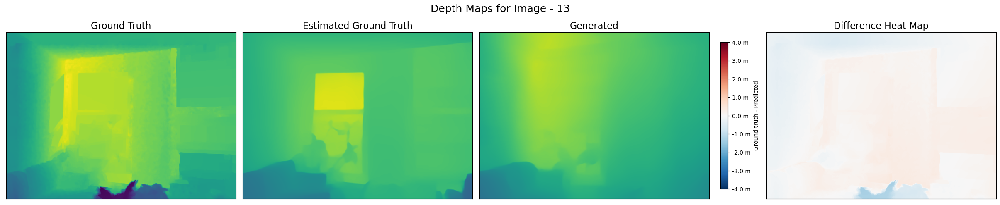

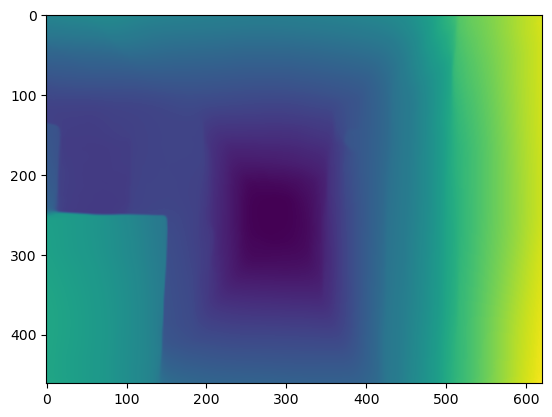

infer depth map done


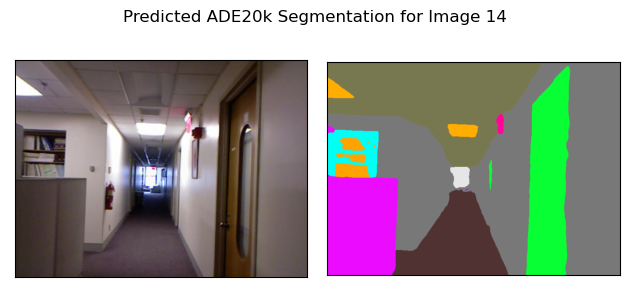

<class 'PIL.Image.Image'>
(704, 512)


  0%|          | 0/30 [00:00<?, ?it/s]

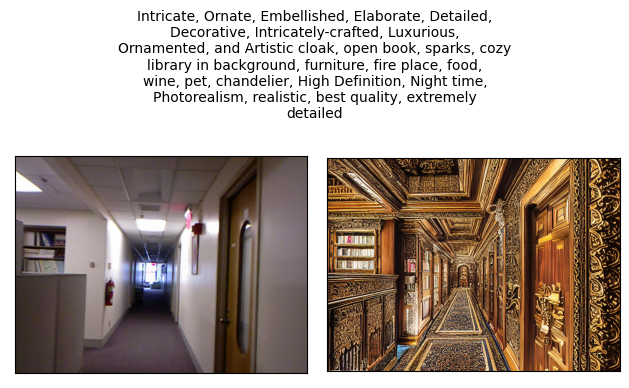

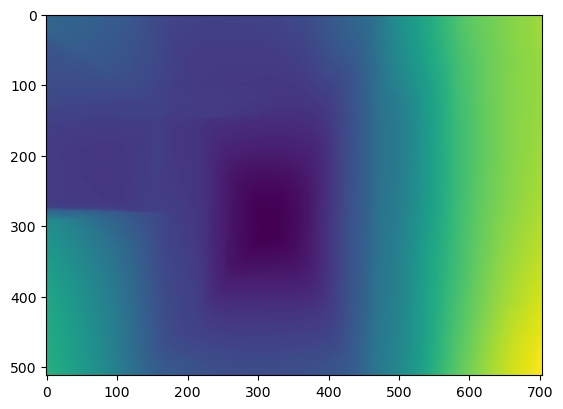

infer depth map done


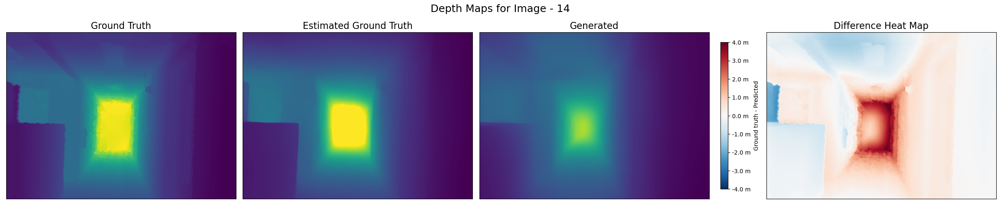

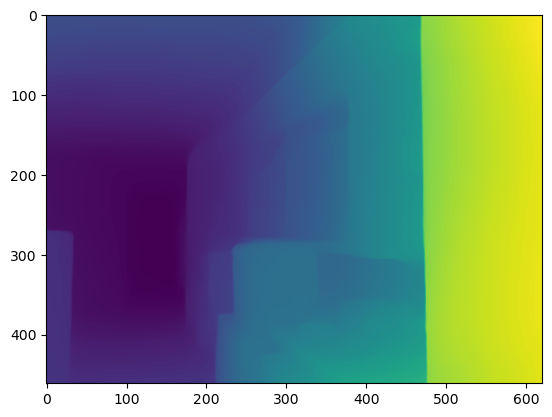

infer depth map done


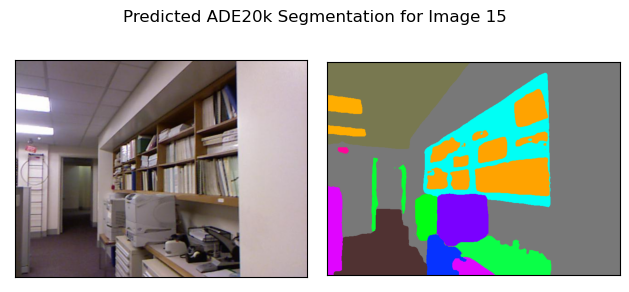

<class 'PIL.Image.Image'>
(704, 512)


  0%|          | 0/30 [00:00<?, ?it/s]

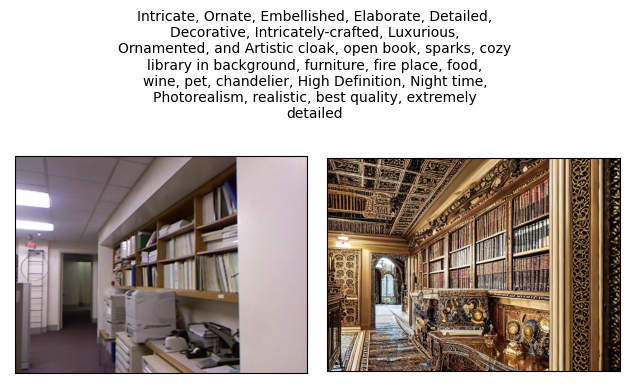

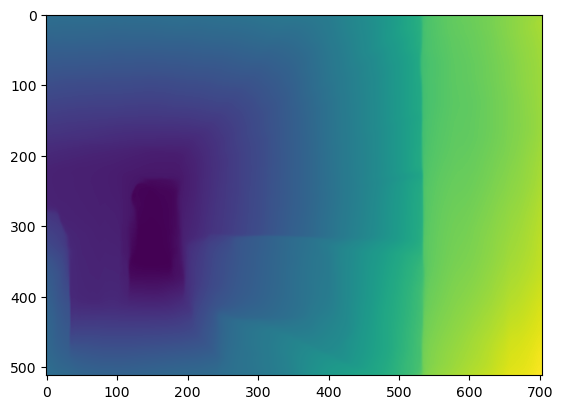

infer depth map done


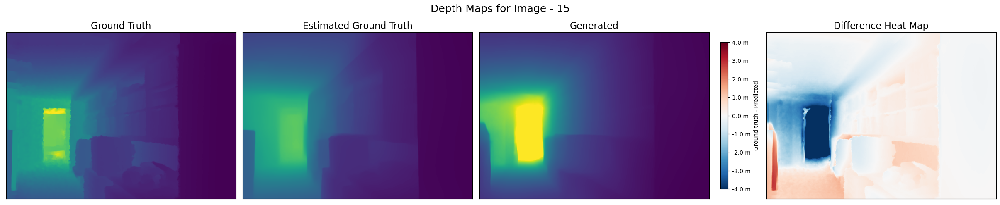

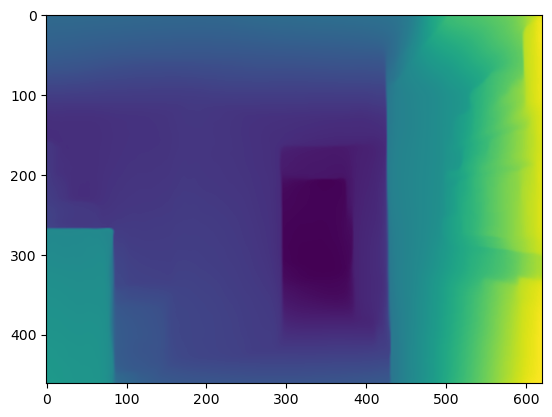

infer depth map done


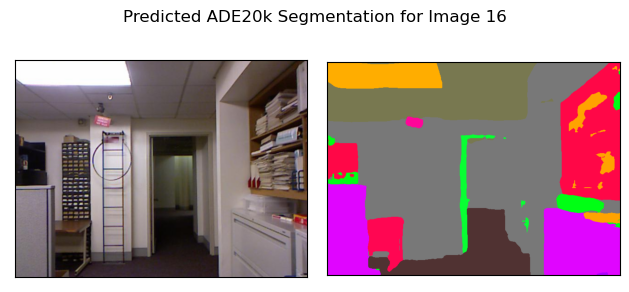

<class 'PIL.Image.Image'>
(704, 512)


  0%|          | 0/30 [00:00<?, ?it/s]

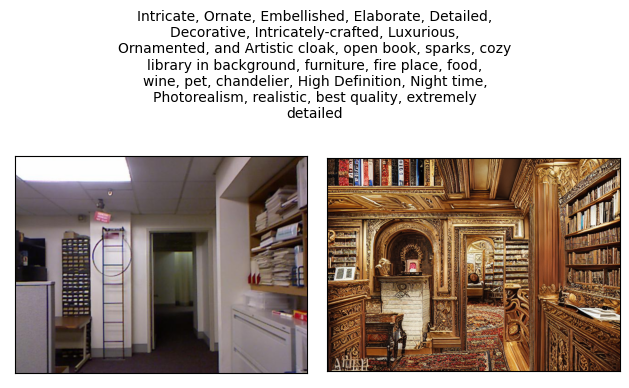

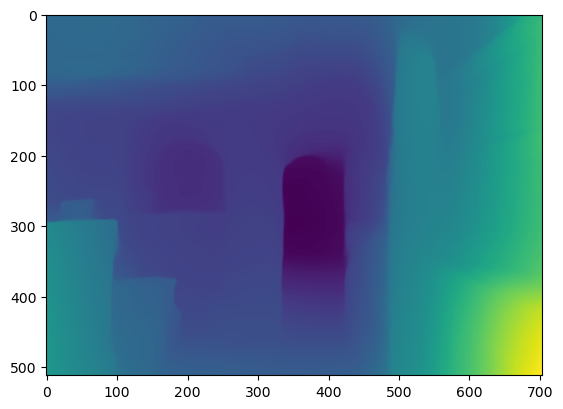

infer depth map done


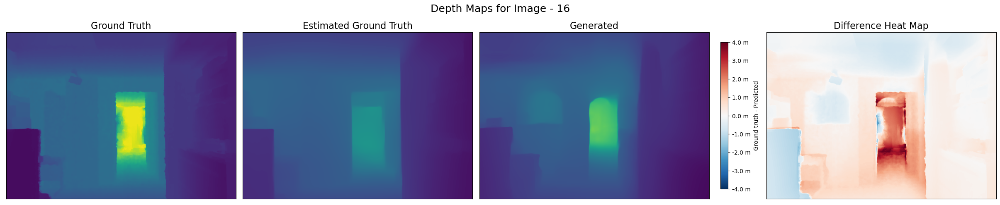

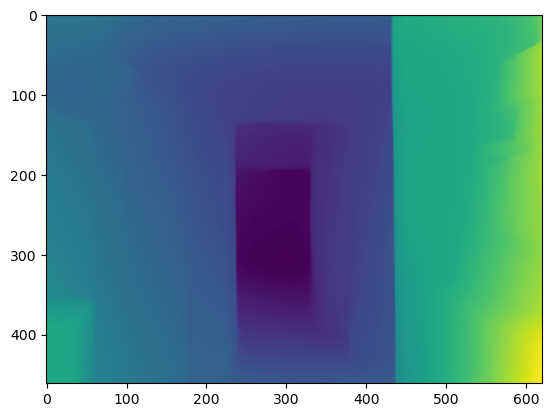

infer depth map done


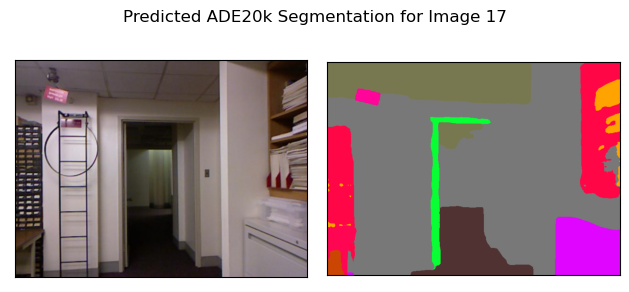

<class 'PIL.Image.Image'>
(704, 512)


  0%|          | 0/30 [00:00<?, ?it/s]

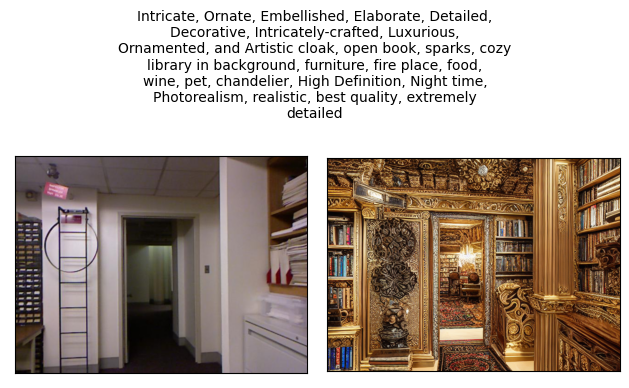

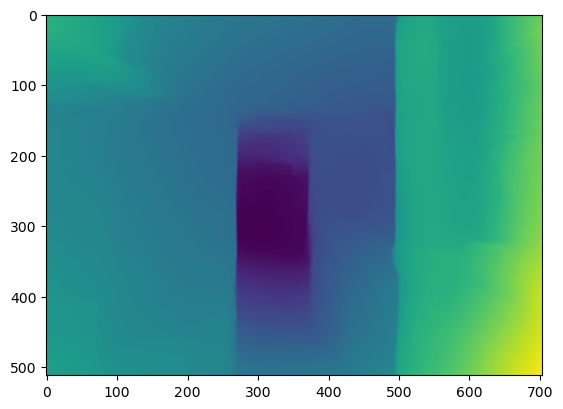

infer depth map done


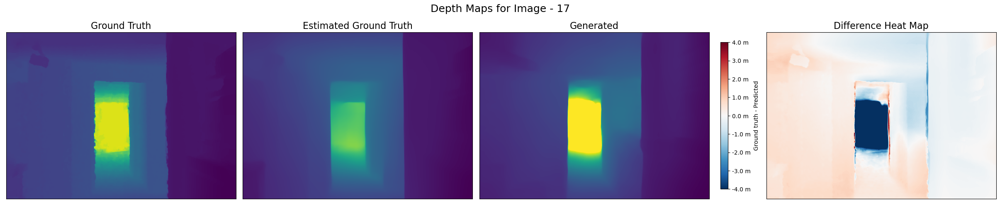

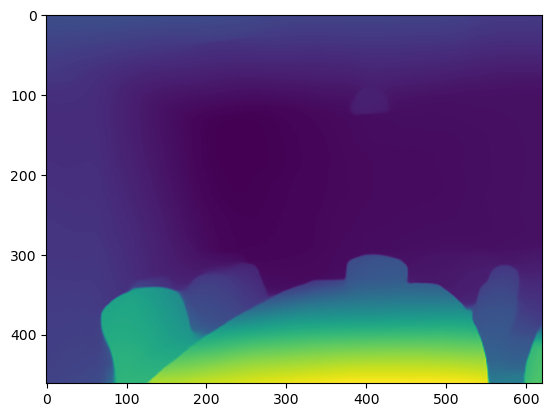

infer depth map done


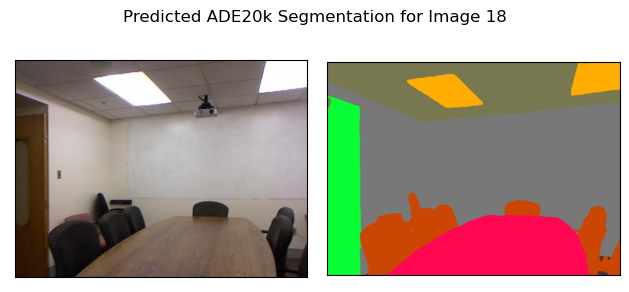

<class 'PIL.Image.Image'>
(704, 512)


  0%|          | 0/30 [00:00<?, ?it/s]

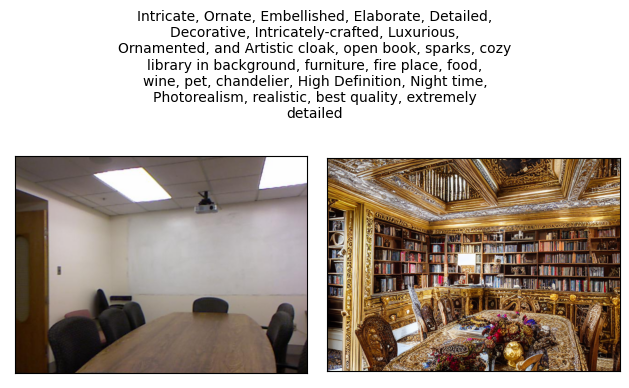

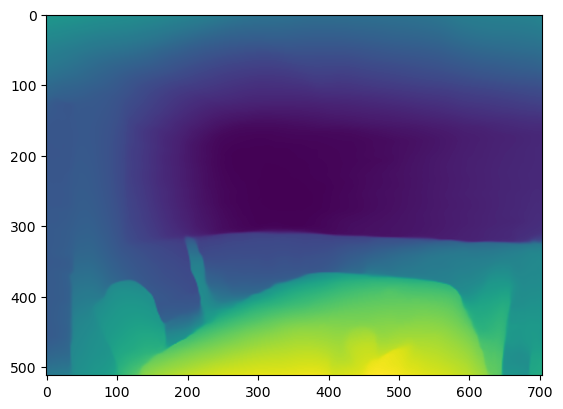

infer depth map done


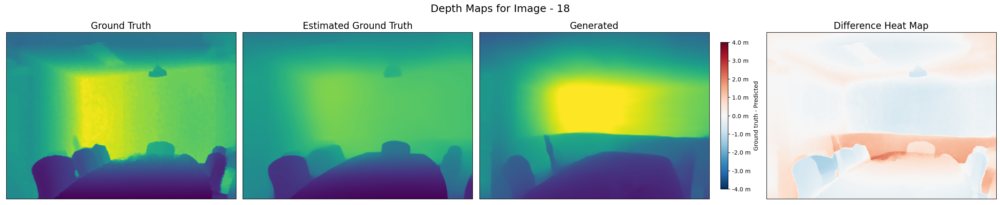

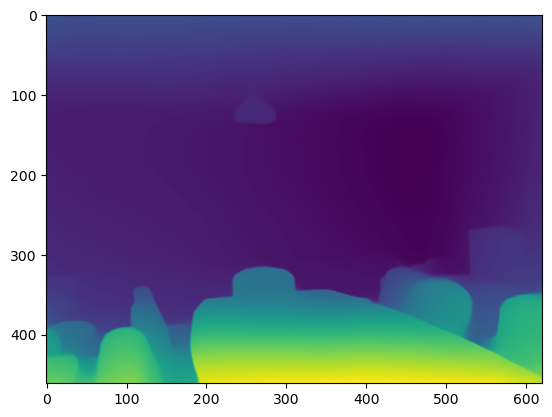

infer depth map done


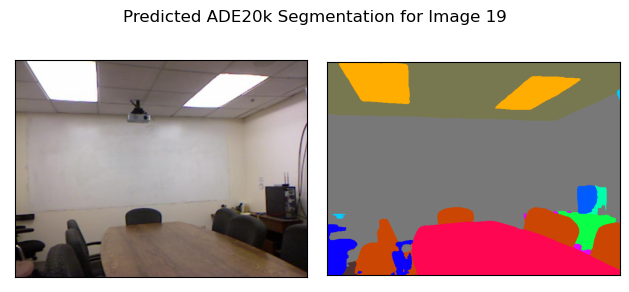

<class 'PIL.Image.Image'>
(704, 512)


  0%|          | 0/30 [00:00<?, ?it/s]

In [ ]:

for i in range(8,rgb_images.shape[0]):
    
        
    if not CONDITION_TYPE == "depth": 
        condition_img_path = nyu_result_root + f"depth_maps/{i}_gen_{CONDITION_TYPE}"
        predict_depth_path = nyu_result_root + f"depth_maps/{i}_gen_depth_from_{CONDITION_TYPE}"
        heatmap_path = nyu_result_root + f"depth_map_heat_maps/{i}_depth_heatmap_from_{CONDITION_TYPE}.png"
        gen_pcd_path = nyu_result_root + f"point_clouds/{i}_gen_pcd_from_{CONDITION_TYPE}"
    else:
        predict_depth_path = nyu_result_root + f"depth_maps/{i}_gen_depth"
        heatmap_path = nyu_result_root + f"depth_map_heat_maps/{i}_depth_heatmap.png"
        gen_pcd_path = nyu_result_root + f"point_clouds/{i}_gen_pcd"
        
    ground_pcd_path = nyu_result_root + f"point_clouds/{i}_ground_pcd"
    view_setting_path = nyu_result_root +"view_setting.json"
    
    gen_img_save_name = save_folder + f"2d_images/{i}_generated_from_{CONDITION_TYPE}.png"
    comparison_save_name = save_folder + f"2d_images/{i}_comparison_from_{CONDITION_TYPE}.png"
    
    
    src_img_np, ground_condition_np = prepare_nyu_data(rgb_images[i], condition_data[i])
    
    if CONDITION_TYPE == "depth":
        ground_depth_map = ground_condition_np
    else:
        _, ground_depth_map =  prepare_nyu_data( condition_img=depth_maps[i])
        
    
    ground_for_heatmap = resize_image(ground_depth_map, image_resolution)    
    
    predict_ground_depth_map = infer_depth_map(src_img_np)
    predict_ground_depth_map = resize_image(predict_ground_depth_map, image_resolution)
    predict_ground_depth_map_aligned = align_midas(predict_ground_depth_map, ground_for_heatmap)
    
    if CONDITION_TYPE == "depth":
        ground_condition, H, W = prepare_nyu_controlnet_depth(predict_ground_depth_map, image_resolution=image_resolution)
    else: # seg
        #ground_condition, H, W = prepare_nyu_controlnet_seg(ground_condition_np, num_classes=num_classes)
        ground_condition, H, W = infer_seg_ade20k(src_img_np, i, save_name= condition_img_path)
        
    print(type(ground_condition))
    print(ground_condition.size)

    gen_img = infer_controlnet(source_image=src_img_np, prompt=prompt, condition_image=ground_condition,
                         H=H, W=W, 
                         guidance_scale = guidance_scale, 
                         num_inference_steps=num_inference_steps,
                         save_name= gen_img_save_name, 
                         comparison_save_name= comparison_save_name)

    gen_img_np = np.array(gen_img)

    #ground_depth_map = infer_depth_map(source_img_np)
        
        
    predict_depth_map = infer_depth_map(gen_img_np, save_name=predict_depth_path)
    predict_depth_map_aligned = align_midas(predict_depth_map, ground_for_heatmap)

    heatmap = get_depth_heat_map(ground_for_heatmap, predict_ground_depth_map_aligned, predict_depth_map_aligned,
                                img_id=i, save_name=heatmap_path)
    
    
    original_pcd = get_point_cloud(src_img_np, ground_depth_map,  pcd_path=ground_pcd_path+".pcd")
    # original_pcd = get_point_cloud(src_img_np, ground_depth_map,  pcd_path=ground_pcd_path+".pcd")
    generated_pcd = get_point_cloud(gen_img_np, predict_depth_map_aligned, pcd_path=gen_pcd_path+".pcd")

    
    capture_pcd_with_view_params(pcd=original_pcd, pcd_path=ground_pcd_path+".png", view_setting_path=view_setting_path)
    capture_pcd_with_view_params(pcd=generated_pcd, pcd_path=gen_pcd_path+".png", view_setting_path=view_setting_path)
    
    
    #eval_list = get_eval_results(src_img_np, gen_img_np, ground_depth_map, predict_depth_map_aligned)
    
    
    #with open(eval_results_path, 'a') as f_object:
 
     #   writer_object = writer(f_object)
 
        # Pass the list as an argument into
        # the writerow()
      #  writer_object.writerow(eval_list)
 
        # Close the file object
       # f_object.close()
    
    
    

In [22]:
from utils.preprocessing import prepare_nyu_data

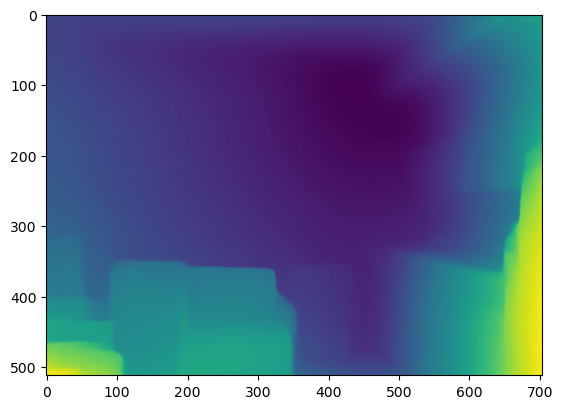

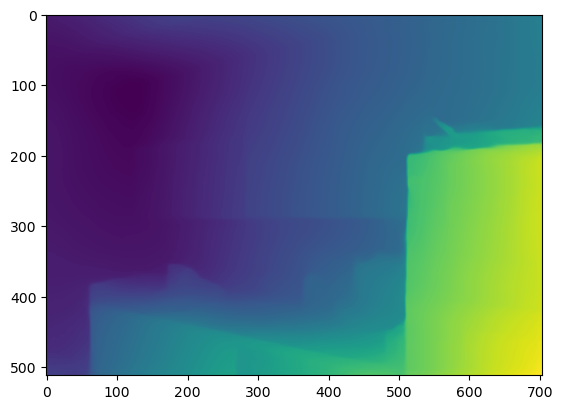

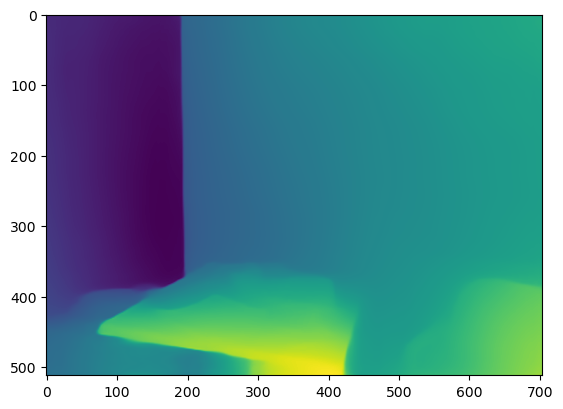

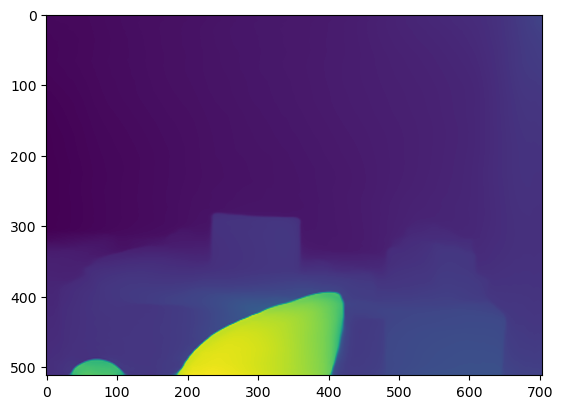

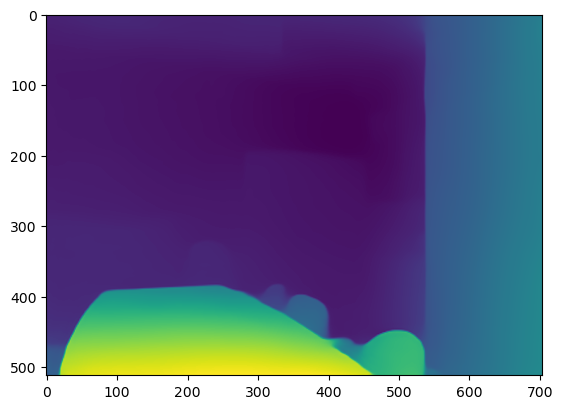

...

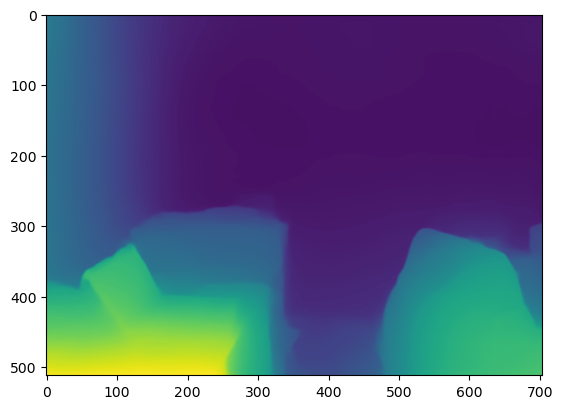

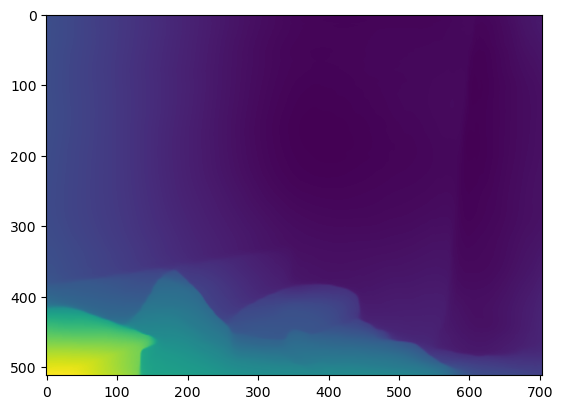

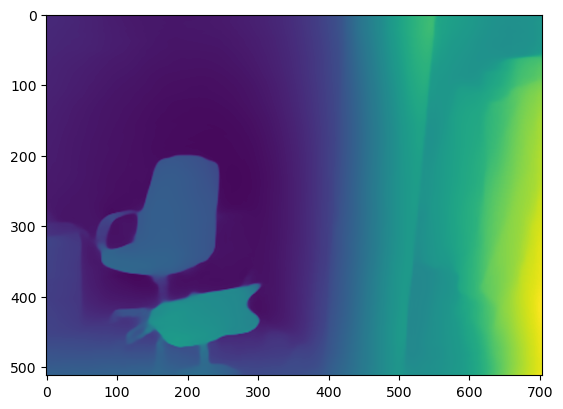

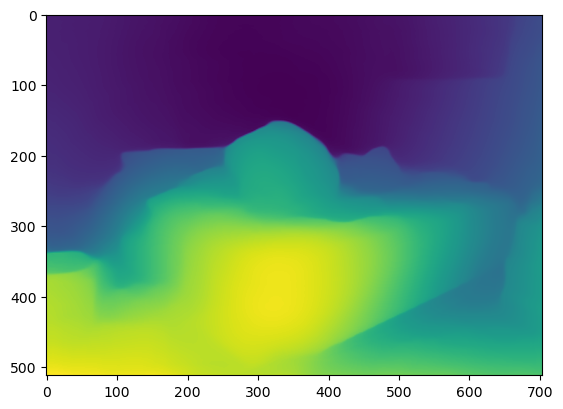

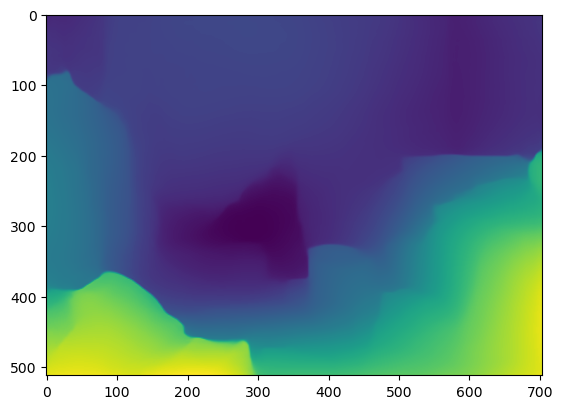

KeyboardInterrupt: 

In [23]:

for i in range(0,200):
    
        
    if not CONDITION_TYPE == "depth": 
        condition_img_path = nyu_result_root + f"depth_maps/{i}_gen_{CONDITION_TYPE}"
        predict_depth_path = nyu_result_root + f"depth_maps/{i}_gen_depth_from_{CONDITION_TYPE}"
        heatmap_path = nyu_result_root + f"depth_map_heat_maps/{i}_depth_heatmap_from_{CONDITION_TYPE}.png"
        gen_pcd_path = nyu_result_root + f"point_clouds/{i}_gen_pcd_from_{CONDITION_TYPE}"
    else:
        predict_depth_path = nyu_result_root + f"depth_maps/{i}_gen_depth"
        heatmap_path = nyu_result_root + f"depth_map_heat_maps/{i}_depth_heatmap.png"
        gen_pcd_path = nyu_result_root + f"point_clouds/{i}_gen_pcd"
        
    predict_ground_depth_path = nyu_result_root + f"predicted_ground_truth_depth_maps/{i}_predict_ground_depth"
    
    
    src_img_np, ground_condition_np = prepare_nyu_data(rgb_images[i], condition_data[i], 512)
    
    predict_ground_depth_map = infer_depth_map(src_img_np, save_name=predict_ground_depth_path)
    

# Rebuilding Point Clouds for Visualisation

In [112]:
def rebuild_point_clouds(i, display=True, seg=True):


    predict_depth_path = nyu_result_root + f"depth_maps/{i}_gen_depth.npy"
    predict_depth_map = np.load(predict_depth_path)
    src_img_np, ground_depth_map = prepare_nyu_data(rgb_images[i], depth_maps[i])
    ground_depth, H, W = prepare_nyu_controlnet(ground_depth_map)
    gen_img = Image.open(save_folder + f"2d_images/{i}_generated.png") 
    gen_img.show()
    gen_img_np = np.array(gen_img)
    groundmap_for_heatmap = resize_image(ground_depth_map, image_resolution)
    predict_depth_map_aligned = align_midas(predict_depth_map, groundmap_for_heatmap)
    
    ground_pcd_path = nyu_result_root + f"point_clouds/{i}_ground_pcd"
    gen_pcd_path = nyu_result_root + f"point_clouds/{i}_gen_pcd"

    original_pcd = get_point_cloud(src_img_np, ground_depth_map,  pcd_path=ground_pcd_path+".pcd", display=display)
    generated_pcd = get_point_cloud(gen_img_np, predict_depth_map_aligned, pcd_path=gen_pcd_path+".pcd", display=display)
    
    #pcd = o3d.io.read_point_cloud( nyu_result_root + f"point_clouds/{i}_ground_pcd.pcd")
    #o3d.visualization.draw_geometries([pcd])
    
    return original_pcd, generated_pcd
    

In [108]:
def rebuild_point_clouds_ground_depth(i, display=True):


    predict_depth_path = nyu_result_root + f"depth_maps/{i}_gen_depth.npy"
    predict_depth_map = np.load(predict_depth_path)
    src_img_np, ground_depth_map = prepare_nyu_data(rgb_images[i], depth_maps[i])
    ground_depth, H, W = prepare_nyu_controlnet(ground_depth_map)
    gen_img = Image.open(save_folder + f"2d_images/{i}_generated.png") 
    gen_img.show()
    gen_img_np = np.array(gen_img)
    groundmap_for_heatmap = resize_image(ground_depth_map, image_resolution)
    predict_depth_map_aligned = align_midas(predict_depth_map, groundmap_for_heatmap)
    
    ground_pcd_path = nyu_result_root + f"point_clouds/{i}_ground_pcd"
    gen_pcd_path = nyu_result_root + f"point_clouds/{i}_gen_pcd"

    original_pcd = get_point_cloud(src_img_np, ground_depth_map,  pcd_path=ground_pcd_path+".pcd", display=display)
    generated_pcd = get_point_cloud(gen_img_np, groundmap_for_heatmap, pcd_path=gen_pcd_path+"_ground_depth.pcd", display=display)
    
    #pcd = o3d.io.read_point_cloud( nyu_result_root + f"point_clouds/{i}_ground_pcd.pcd")
    #o3d.visualization.draw_geometries([pcd])
    
    return original_pcd, generated_pcd

In [109]:
import matplotlib as mpl
import matplotlib.cm as cm

def rebuild_point_clouds_heatmap(i, display=True):


    predict_depth_path = nyu_result_root + f"depth_maps/{i}_gen_depth.npy"
    predict_depth_map = np.load(predict_depth_path)
    src_img_np, ground_depth_map = prepare_nyu_data(rgb_images[i], depth_maps[i])
    ground_depth, H, W = prepare_nyu_controlnet(ground_depth_map)
    gen_img = Image.open(save_folder + f"2d_images/{i}_generated.png") 
    gen_img.show()
    gen_img_np = np.array(gen_img)
    groundmap_for_heatmap = resize_image(ground_depth_map, image_resolution)

    predict_depth_map_aligned = align_midas(predict_depth_map, groundmap_for_heatmap)
    
    
    difference_map = groundmap_for_heatmap - predict_depth_map_aligned
    
    norm = mpl.colors.Normalize(vmin=-4, vmax=4)
    cmap = plt.get_cmap('RdBu_r')

    m = cm.ScalarMappable(norm=norm, cmap=cmap)
    heatmap = (m.to_rgba(difference_map)[:,:,:3] * 256).astype(np.uint8)
    
    gen_pcd_path = nyu_result_root +  f"point_clouds/{i}_heatmap_pcd.pcd"

    pcd = get_point_cloud(heatmap, predict_depth_map_aligned, pcd_path=gen_pcd_path, display=display)
    
    #pcd = o3d.io.read_point_cloud( nyu_result_root + f"point_clouds/{i}_heatmap_pcd.pcd")
    #o3d.visualization.draw_geometries([pcd])
    return pcd

In [110]:
a = 5

In [113]:
rebuild_point_clouds(a)

NameError: name 'prepare_nyu_controlnet' is not defined

In [ ]:
rebuild_point_clouds_ground_depth(a)

In [ ]:
rebuild_point_clouds_heatmap(a)

# Creating Meshes

In [ ]:
original_pcd, generated_pcd = rebuild_point_clouds(28)

In [ ]:
get_mesh_from_pcd(original_pcd, method="alpha")

In [ ]:
def evaluate(original_rgb, generated_rgb, original_depth, generated_depth):
    

In [64]:
from scipy.io import loadmat
loadmat("C:/Users/User/Downloads/classMapping40.mat")

{'__header__': b'MATLAB 5.0 MAT-file, Platform: GLNXA64, Created on: Wed Apr  3 23:24:27 2013',
 '__version__': '1.0',
 '__globals__': [],
 'className': array([[array(['wall'], dtype='<U4'), array(['floor'], dtype='<U5'),
         array(['cabinet'], dtype='<U7'), array(['bed'], dtype='<U3'),
         array(['chair'], dtype='<U5'), array(['sofa'], dtype='<U4'),
         array(['table'], dtype='<U5'), array(['door'], dtype='<U4'),
         array(['window'], dtype='<U6'),
         array(['bookshelf'], dtype='<U9'),
         array(['picture'], dtype='<U7'), array(['counter'], dtype='<U7'),
         array(['blinds'], dtype='<U6'), array(['desk'], dtype='<U4'),
         array(['shelves'], dtype='<U7'), array(['curtain'], dtype='<U7'),
         array(['dresser'], dtype='<U7'), array(['pillow'], dtype='<U6'),
         array(['mirror'], dtype='<U6'),
         array(['floor mat'], dtype='<U9'),
         array(['clothes'], dtype='<U7'), array(['ceiling'], dtype='<U7'),
         array(['books'], d

In [75]:

    
    x = ground_condition_np
    
    
    color_group = np.stack( [np.random.choice(range(256), size=3) for _ in range(num_classes)], axis=0 )
    
    rgb_color_image = np.zeros((x.shape[0], x.shape[1], 3), dtype=np.float32)
    rgb_color_image = color_group[np.uint16(x)]

    temp_img = resize_image(rgb_color_image, image_resolution)
    H, W = temp_img.shape[:2]
    new_img = cv2.resize(rgb_color_image, (W, H), interpolation=cv2.INTER_NEAREST)        

    control_image = Image.fromarray(np.uint8(new_img))
    
    return control_image, H, W

error: OpenCV(4.4.0) C:\Users\appveyor\AppData\Local\Temp\1\pip-req-build-71670poj\opencv\modules\imgproc\src\resize.cpp:3807: error: (-215:Assertion failed) func != 0 in function 'cv::hal::resize'


In [76]:
rgb_color_image.shape

(480, 640, 3)

In [77]:
src_img_np.shape


(480, 640, 3)

In [83]:
 ground_condition, H, W = prepare_nyu_controlnet_seg(ground_condition_np, num_classes=num_classes)

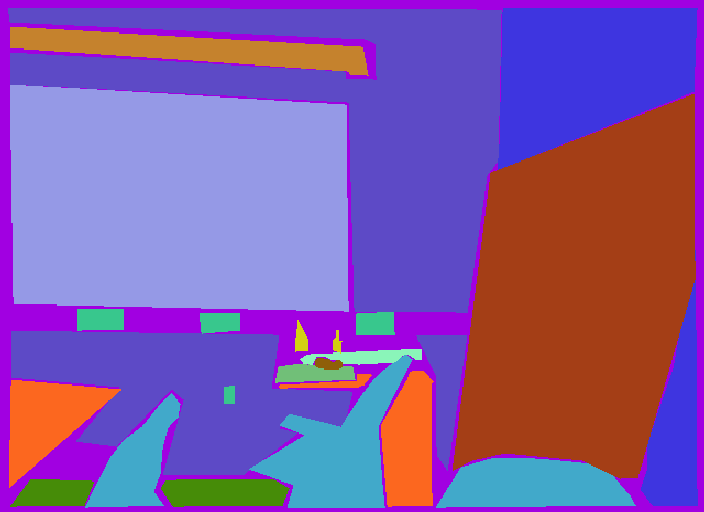

In [84]:
 ground_condition